In [1]:
import loompy
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import os
import numpy_groupies as npg
from scipy import sparse
import seaborn
import matplotlib as mpl
import gget
import pickle
import tomotopy as tt

# suppress INFO
import logging
logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)

# make font changeable in Illustrator
mpl.rcParams['pdf.fonttype'] = 42

# save figure with no pad
mpl.rcParams['savefig.pad_inches'] = 0
mpl.rcParams['savefig.bbox'] = 'tight'

# set axes width
mpl.rcParams['axes.linewidth'] = 0.2
mpl.rcParams['xtick.minor.pad'] = 0
mpl.rcParams['xtick.major.pad'] = 0
mpl.rcParams['ytick.minor.pad'] = 0
mpl.rcParams['ytick.major.pad'] = 0
mpl.rcParams['xtick.minor.width'] = 0.2
mpl.rcParams['xtick.major.width'] = 0.2
mpl.rcParams['ytick.minor.width'] = 0.2
mpl.rcParams['ytick.major.width'] = 0.2

# use colorblind seaborn style
plt.style.use('seaborn-colorblind')

# colors for ROI Groups
color_dict = dict(
    zip(
        ["Cerebral cortex", "Hippocampus", "Cerebral nuclei", "Hypothalamus", "Thalamus", "Midbrain", "Pons", "Cerebellum", "Myelencephalon", "Spinal cord"],
        ['#4682f0', '#8eb7d1', '#89d8e0', '#f28e37', '#e7bc1f', '#43ad78', '#a7236e', '#ed5f8e', '#955ba5', '#eec2a4']
    )
)

In [362]:
folder = '/proj/human_adult/20220222/harmony/paris_top_bug/data/'
figure_folder = '/home/kimberly/figures/revision/'

In [4]:
# get ncRNA gene names
with loompy.connect(f'{folder}/Pool.loom', 'r') as ds:
    accession_dict = dict(zip(
        pd.Series(ds.ra.Accession).str.split('.').str[0],
        np.arange(ds.shape[0])
    ))
    ncRNA_genes = np.loadtxt('../202204/ncRNA.txt', dtype='object')
    accession_ix = np.array([accession_dict.get(x, '') for x in ncRNA_genes])
    accession_ix = accession_ix[accession_ix != ''].astype('int')
    ncRNA_genes = ds.ra.Gene[accession_ix]

In [5]:
cbl = seaborn.color_palette('colorblind')
cbl

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

## Splatter 5 Topics

In [381]:
k = 5
model = tt.LDAModel.load(f'/proj/human_adult/20220222/harmony/revision/LDA/Downsampled10/{k}/model.bin')
cells = np.loadtxt(f'/proj/human_adult/20220222/harmony/revision/LDA/Downsampled10/{k}/cells.txt').astype('int')
transformed = np.vstack([doc.get_topic_dist() for doc in model.docs])
transformed.shape

(3820, 5)

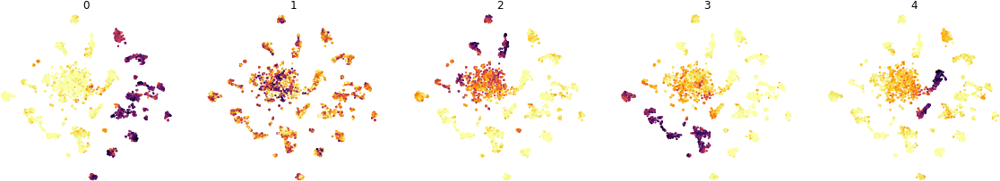

In [382]:
with loompy.connect('/proj/human_adult/20220222/harmony/revision/data/Downsampled10.loom', 'r') as ds:

    plt.figure(None, (20, 20))
    gs = plt.GridSpec(5, 5)

    xy = ds.ca.TSNE[cells]
    
    for i in range(k):
        plt.subplot(gs[i])
        plt.scatter(xy[:, 0], xy[:, 1], c=transformed[:, i], s=5, lw=0, rasterized=True, cmap='inferno_r')
        plt.axis('off')
        plt.title(i)
        plt.margins(0.01, 0.01)

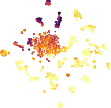

In [383]:
plt.figure(None, (2, 2))

with loompy.connect('/proj/human_adult/20220222/harmony/revision/data/Downsampled10.loom', 'r') as ds:

    xy = ds.ca.TSNE[cells]
    c=transformed[:, 2]

    plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c=c[cells], s=2, lw=0, cmap='inferno_r', rasterized=True)
    plt.margins(0.01, 0.01)
    plt.axis('off')
    plt.savefig(f'{figure_folder}/LDA_SplatterTopic_5Topics.pdf', dpi=300)

# Splatter 11 topics

In [440]:
k = 11
model = tt.LDAModel.load(f'/proj/human_adult/20220222/harmony/revision/LDA/Downsampled10/{k}/model.bin')
cells = np.loadtxt(f'/proj/human_adult/20220222/harmony/revision/LDA/Downsampled10/{k}/cells.txt').astype('int')
transformed = np.vstack([doc.get_topic_dist() for doc in model.docs])
transformed.shape

(3820, 11)

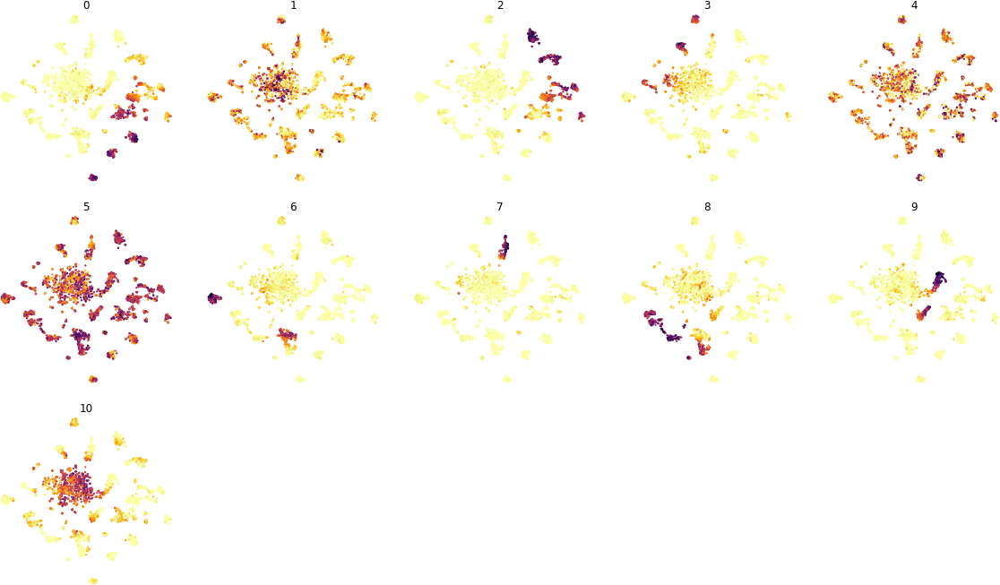

In [441]:
with loompy.connect('/proj/human_adult/20220222/harmony/revision/data/Downsampled10.loom', 'r') as ds:

    plt.figure(None, (20, 20))
    gs = plt.GridSpec(5, 5)

    xy = ds.ca.TSNE[cells]
    
    for i in range(k):
        plt.subplot(gs[i])
        plt.scatter(xy[:, 0], xy[:, 1], c=transformed[:, i], s=5, lw=0, rasterized=True, cmap='inferno_r')
        plt.axis('off')
        plt.title(i)
        plt.margins(0.01, 0.01)

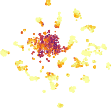

In [364]:
plt.figure(None, (2, 2))

with loompy.connect('/proj/human_adult/20220222/harmony/revision/data/Downsampled10.loom', 'r') as ds:

    xy = ds.ca.TSNE[cells]
    c=transformed[:, 10]

    plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c=c[cells], s=2, lw=0, cmap='inferno_r', rasterized=True)
    plt.margins(0.01, 0.01)
    plt.axis('off')
    plt.savefig(f'{figure_folder}/LDA_SplatterTopic.pdf', dpi=300)

In [348]:
topics = np.vstack([model.get_topic_word_dist(i, normalize=False) for i in range(k)])
total_per_gene = topics.sum(axis=0)
normed_topics = topics / total_per_gene

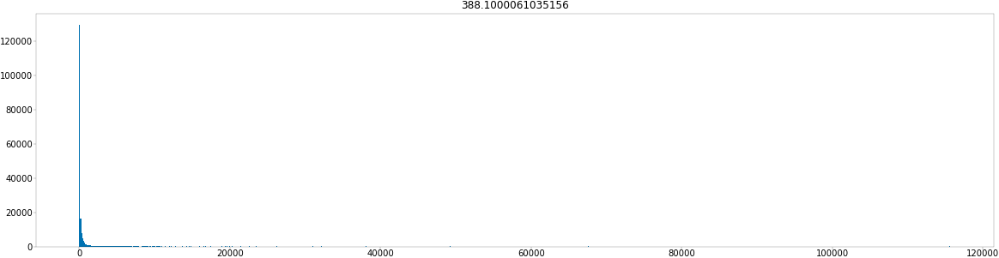

In [349]:
plt.figure(None, (20, 5))
plt.hist(topics.flatten(), bins=1000)
plt.title(np.percentile(topics.flatten(), 90))
plt.show()

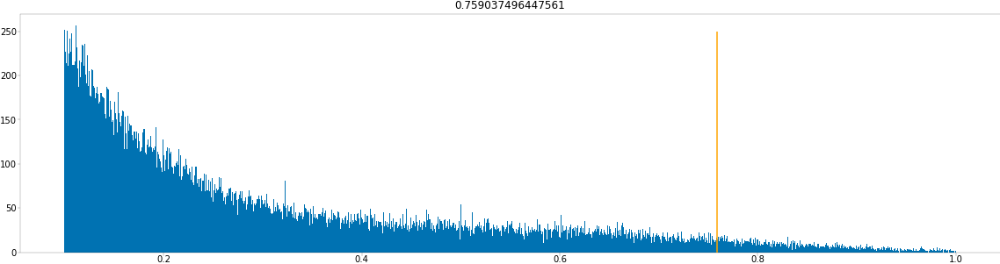

In [350]:
plt.figure(None, (20, 5))
plt.hist(normed_topics.flatten(), bins=1000, range=(0.1, 1))
plt.vlines(np.percentile(normed_topics.flatten(), 99), 0, 250, color='orange')
plt.title(np.percentile(normed_topics.flatten(), 99))
plt.show()

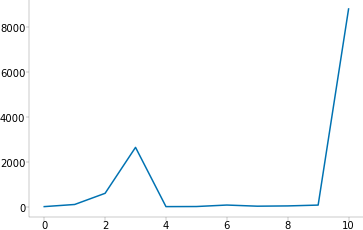

In [351]:
g = 'KLHL1'

with loompy.connect('/proj/human_adult/20220222/harmony/revision/data/Downsampled10.loom', 'r') as ds:

    ix_dict = dict(zip(ds.ra.Accession, np.arange(ds.shape[0])))
    ix = np.array([ix_dict.get(x) for x in list(model.vocabs)])
    plt.plot(topics[:, ds.ra.Gene[ix] == g])

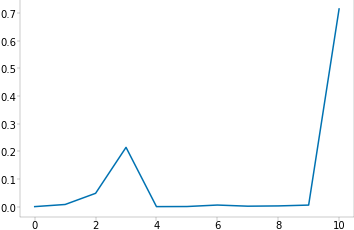

In [352]:
with loompy.connect('/proj/human_adult/20220222/harmony/revision/data/Downsampled10.loom', 'r') as ds:

    ix_dict = dict(zip(ds.ra.Accession, np.arange(ds.shape[0])))
    ix = np.array([ix_dict.get(x) for x in list(model.vocabs)])
    plt.plot(normed_topics[:, ds.ra.Gene[ix] == g])

In [367]:
with loompy.connect('/proj/human_adult/20220222/harmony/revision/data/Downsampled10.loom', 'r') as ds:

    k = topics.shape[0]
    accessions = ds.ra.Accession
    accession_dict = dict(zip(accessions, range(ds.shape[0]))) 
    
    filtered_top_genes = {}
    for n in range(k):
        # only keep genes that are > 100 and > 0.7 normed
        selected = (normed_topics[n] > 0.5) & (topics[n] > 100) 
        print(selected.sum())
        filtered_topics = topics[n, selected]
        ix = np.array([accession_dict.get(x) for x in list(model.vocabs)])
        filtered_genes = ds.ra.Gene[ix][selected]
        filtered_top_genes[n] = filtered_genes[filtered_topics.argsort()[::-1]]

312
709
172
65
1533
4562
24
49
62
47
127


In [368]:
filtered_top_genes[10]

array(['RMST', 'HTR2C', 'MIR325HG', 'KLHL1', 'SCN9A', 'PEG10', 'ANKFN1',
       'EBF1', 'SCN7A', 'TMEM196', 'STK33', 'DACH2', 'GABRG1', 'PRLR',
       'PCED1B', 'DPYSL3', 'KCNH8', 'AC092957.1', 'STK32B', 'TPH2',
       'AC132153.1', 'AL592156.1', 'EBF2', 'DIRAS3', 'EBF3', 'ESR1',
       'LINC01933', 'AR', 'LINC01876', 'CD36', 'AC114316.1', 'AC090825.1',
       'STON2', 'ARHGEF26-AS1', 'TENT5A', 'OBI1-AS1', 'STK32A',
       'AC007091.1', 'CRNDE', 'HDC', 'TACR3', 'TMEM255A', 'AC007656.2',
       'SLC5A7', 'NKAIN1', 'CCDC178', 'TRPC7', 'HAP1', 'ZFHX4-AS1',
       'GLRA1', 'VWA5B1', 'AC005062.1', 'GPC3', 'RADX', 'CALCR',
       'LINC01798', 'RGS22', 'SLC18A2', 'AL110292.1', 'AL031658.1',
       'AMIGO2', 'DLK1', 'AC092447.7', 'IGDCC4', 'ZNF730', 'ECEL1',
       'ZNF676', 'RTP5', 'GPX3', 'AL137139.2', 'FGF2', 'AVP', 'CNBD1',
       'AC083837.1', 'PON2', 'LINC01515', 'AC090993.1', 'PLSCR4', 'SCML4',
       'TPH1', 'SNTB1', 'CERCAM', 'AC093898.1', 'FGF10', 'SAMD11',
       'FAM9B', 'ID4', 'AT


### TOPIC 0 ###



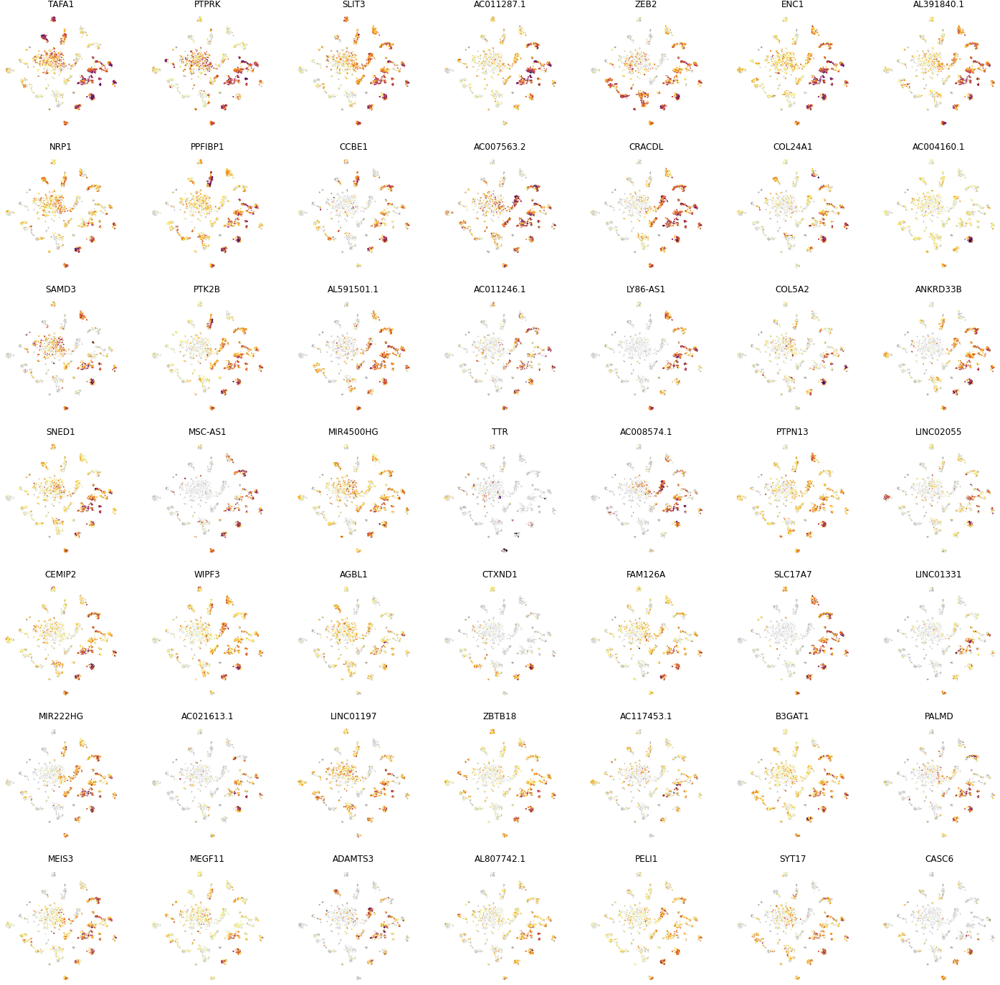


### TOPIC 1 ###



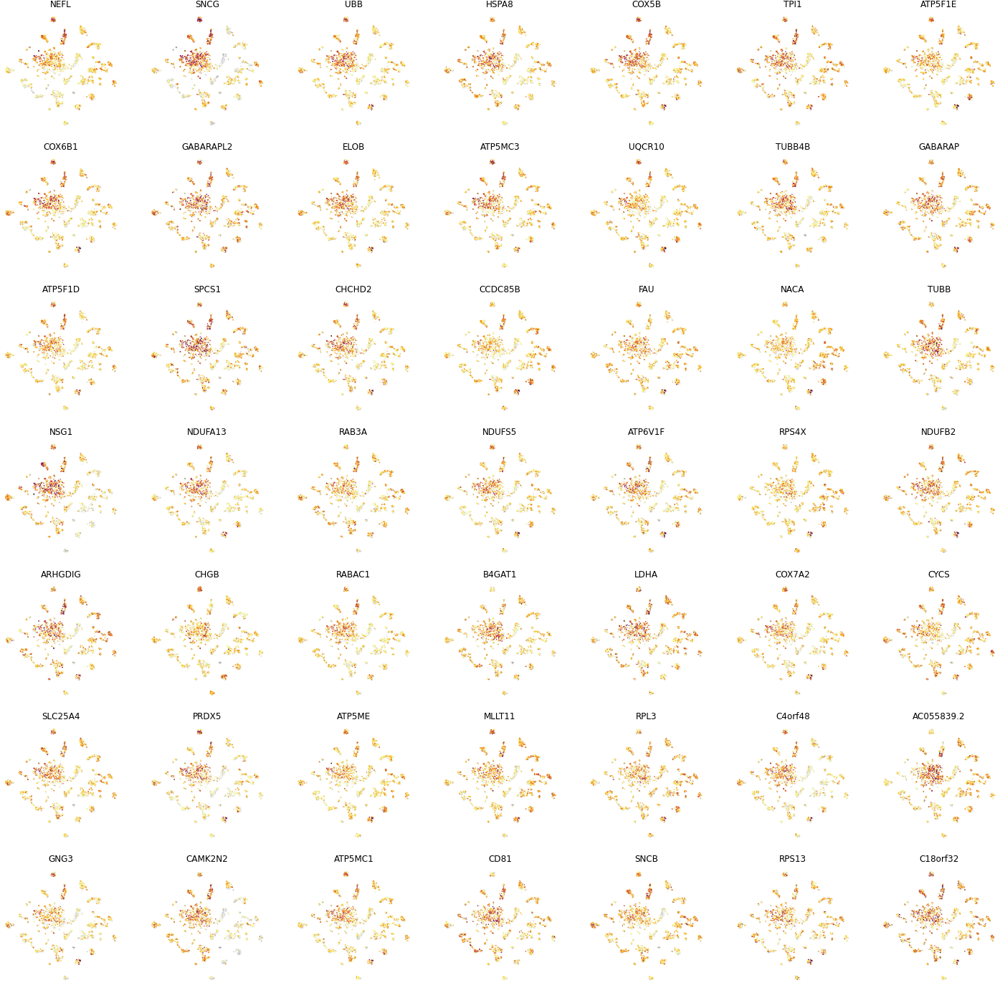


### TOPIC 2 ###



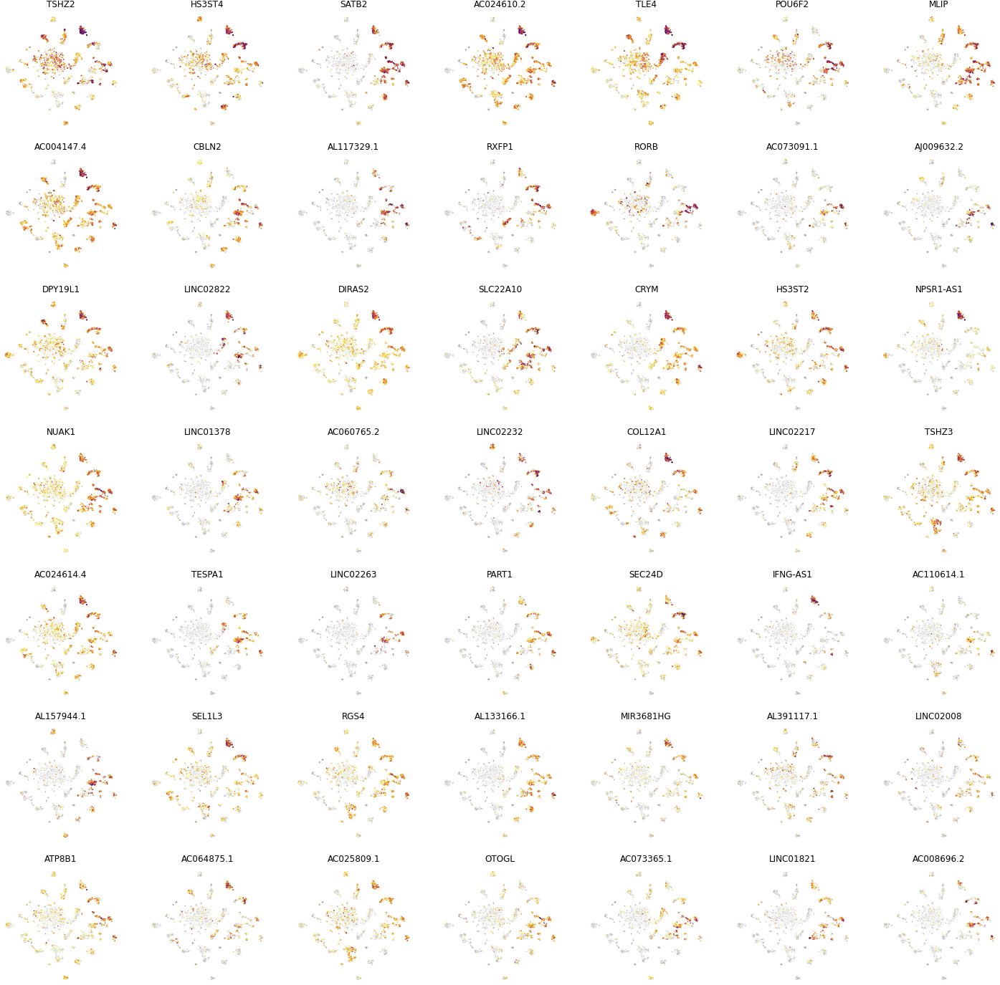


### TOPIC 3 ###



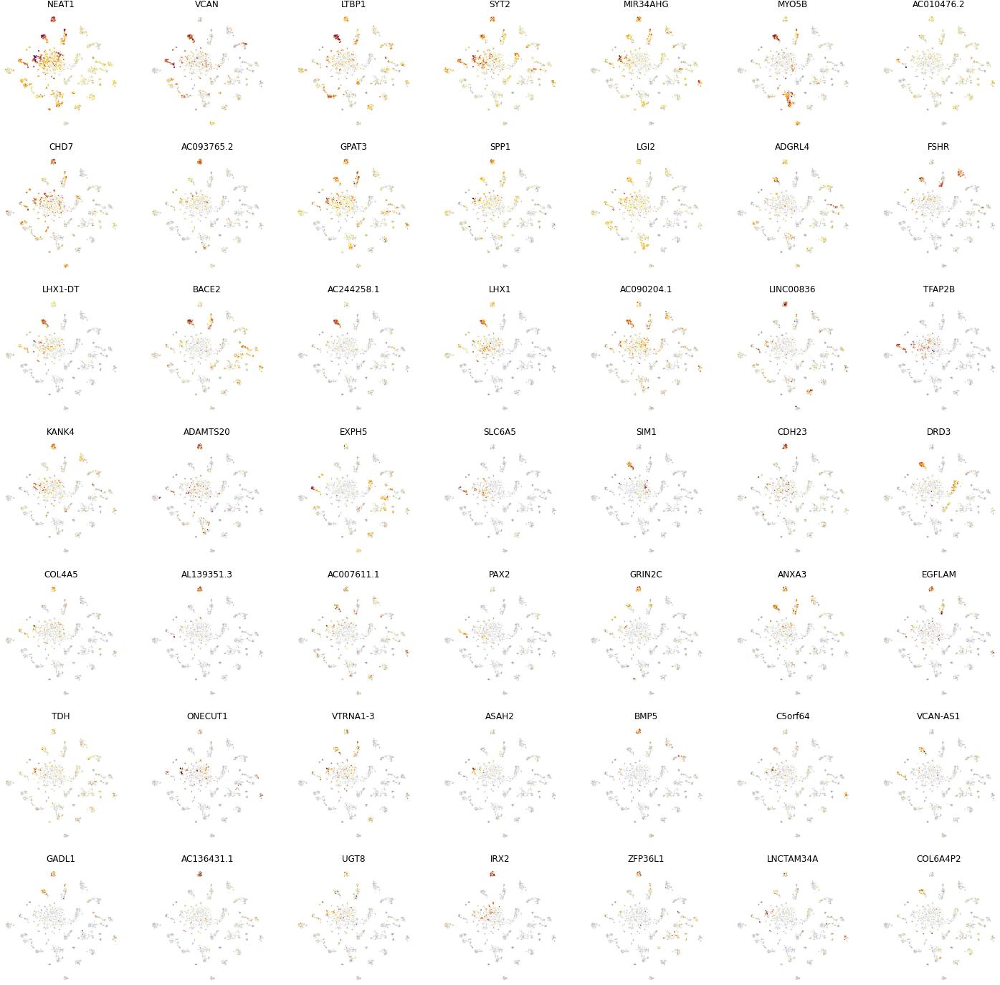


### TOPIC 4 ###



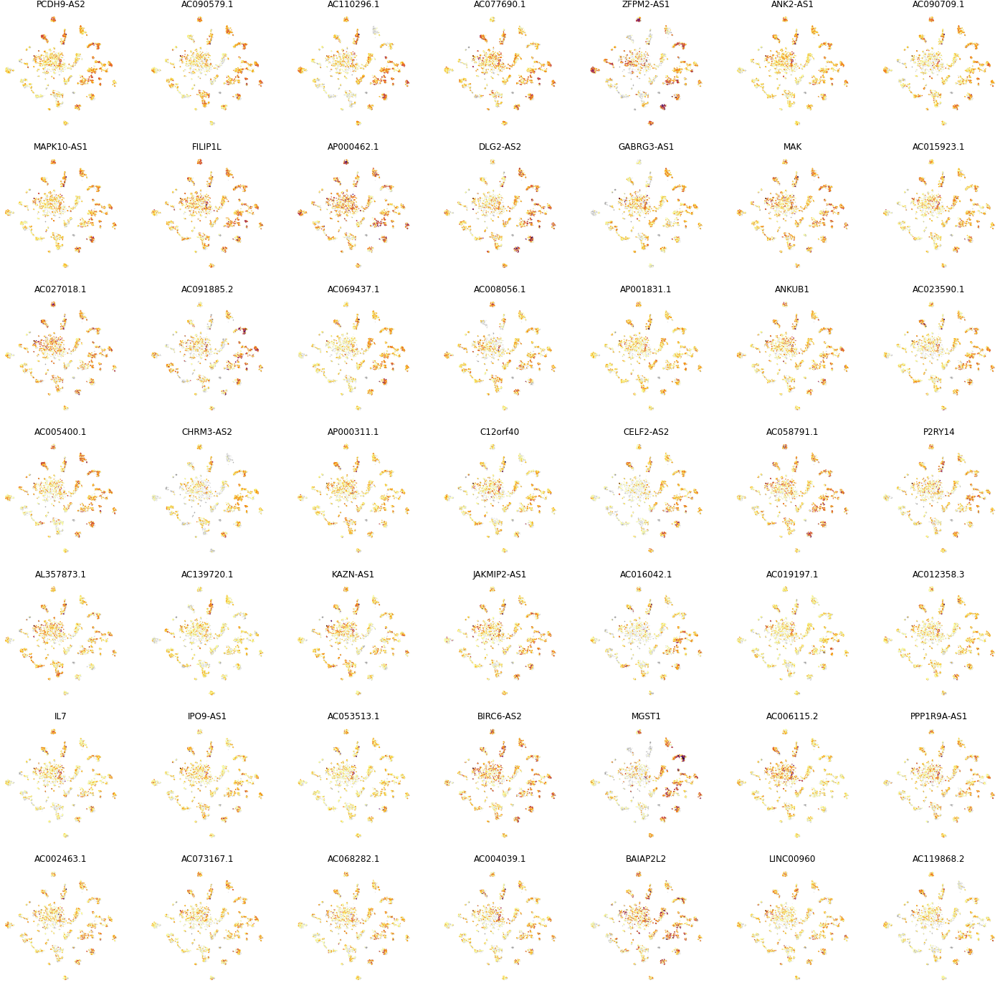


### TOPIC 5 ###



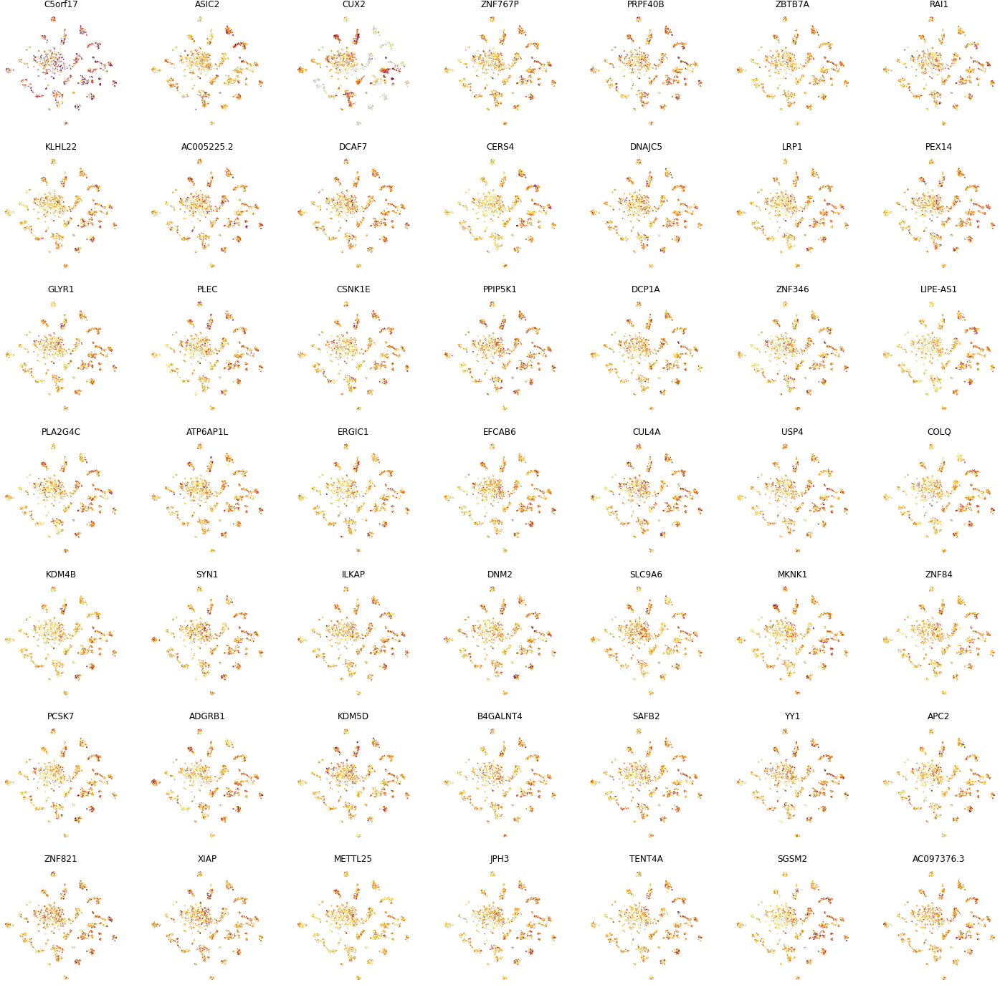


### TOPIC 6 ###



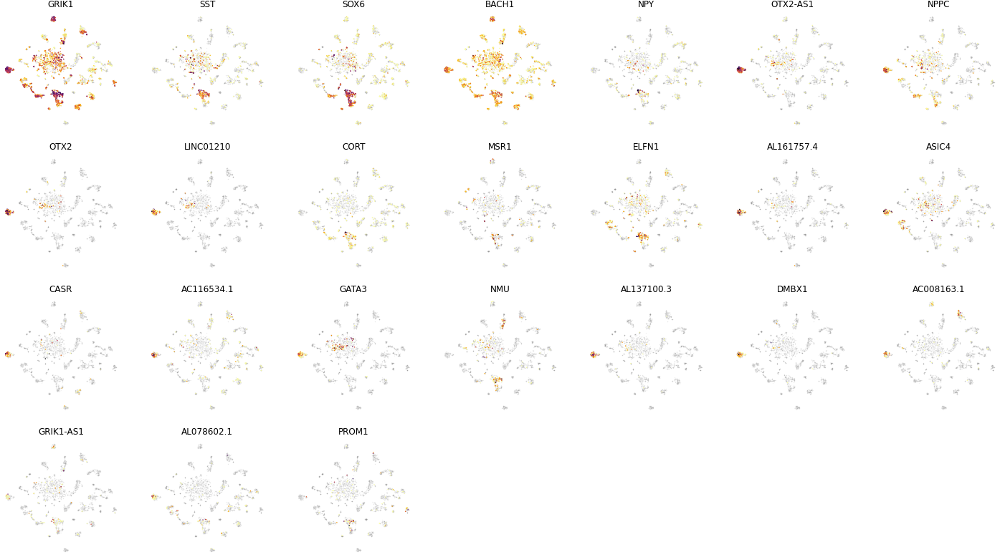


### TOPIC 7 ###



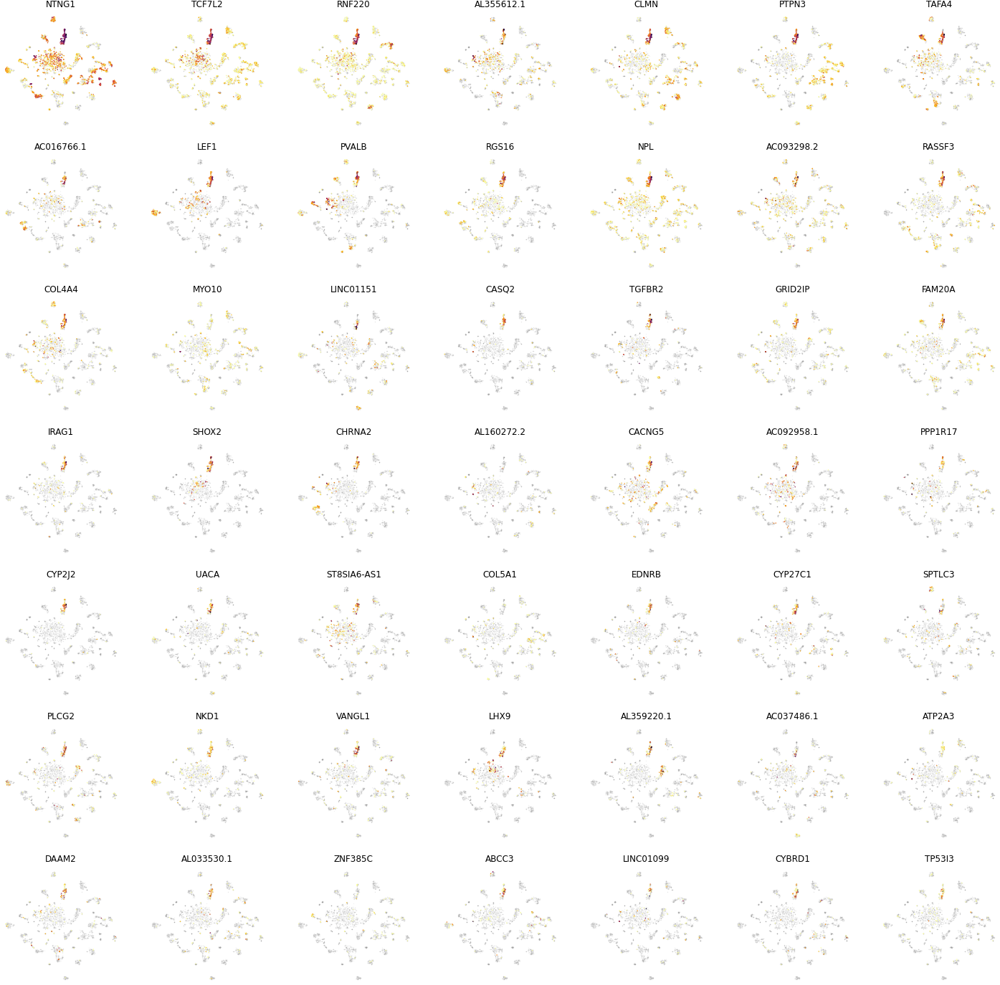


### TOPIC 8 ###



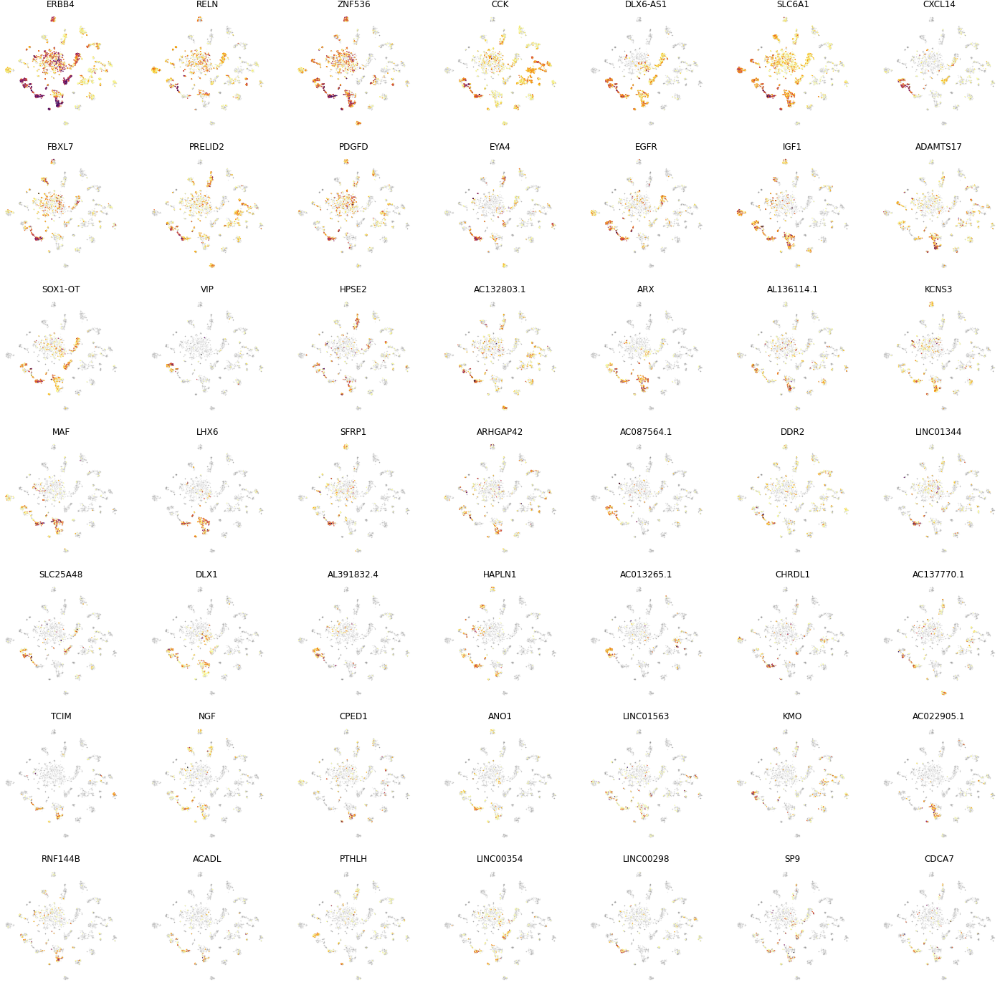


### TOPIC 9 ###



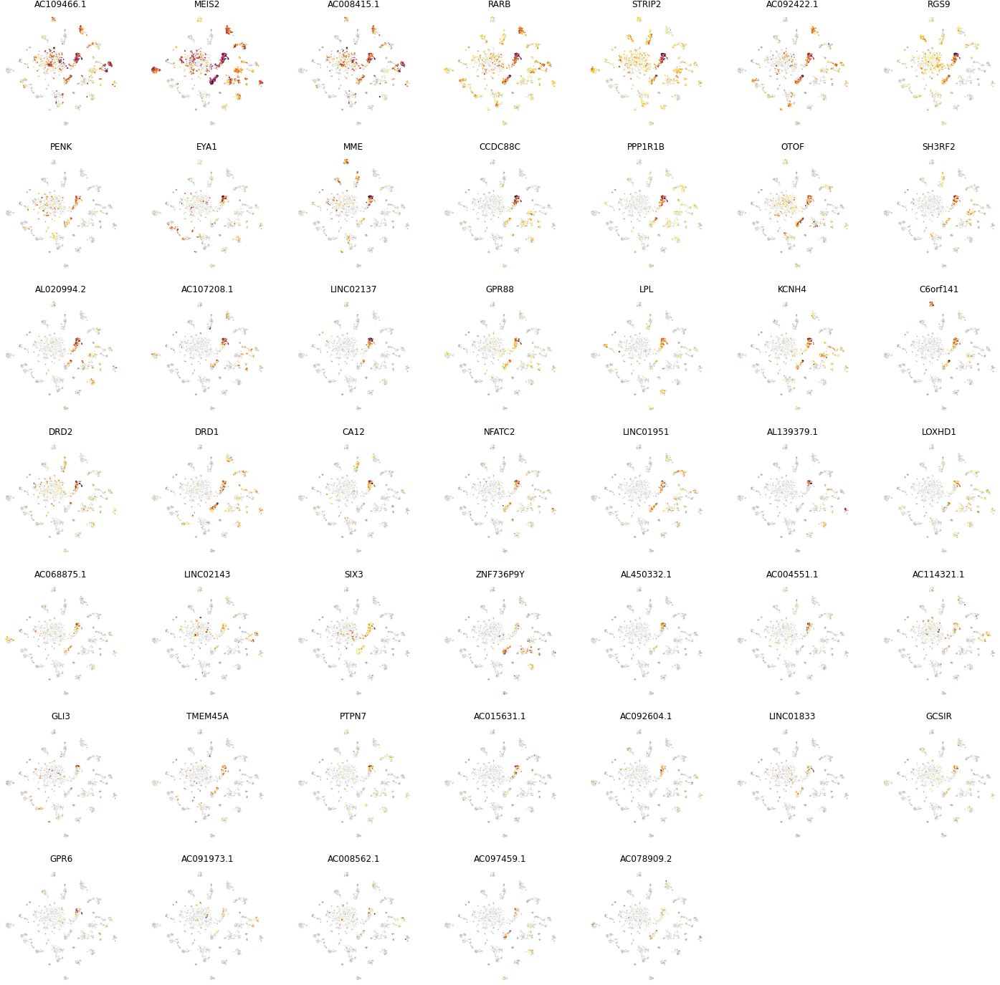


### TOPIC 10 ###



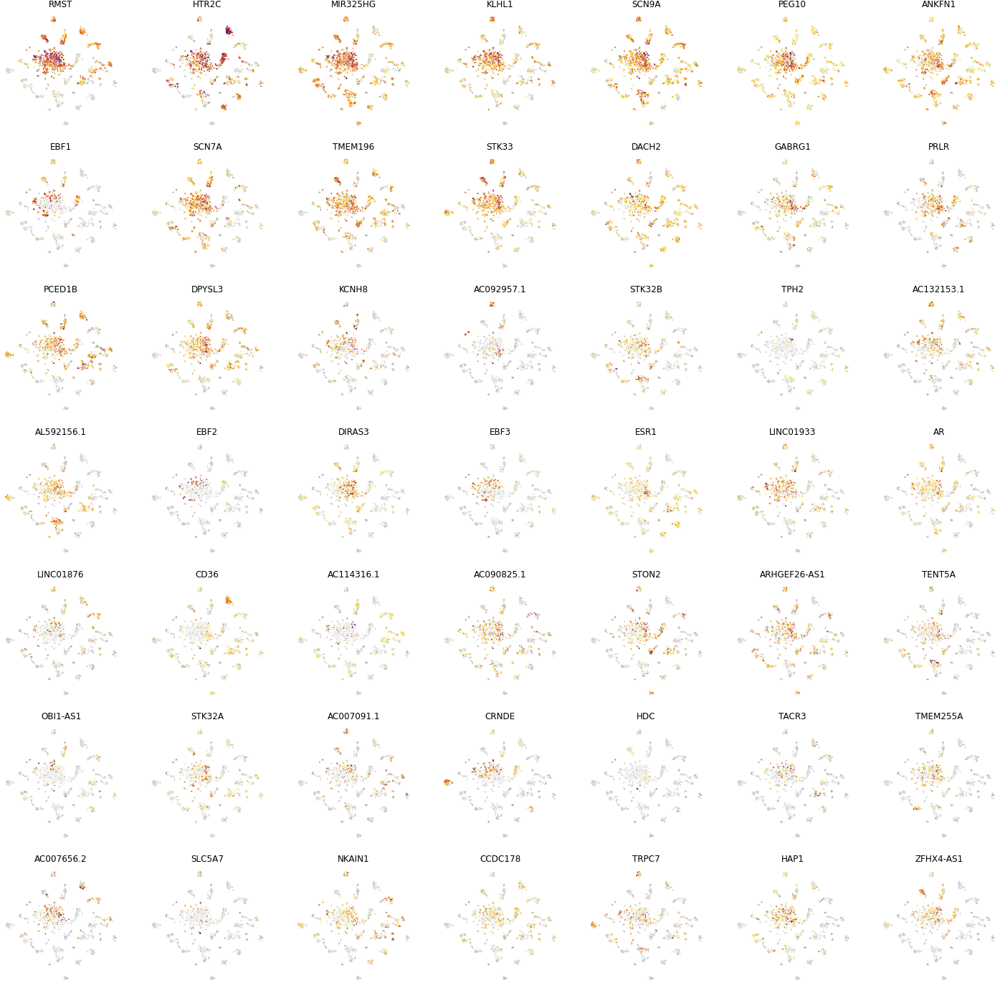

In [359]:
with loompy.connect('/proj/human_adult/20220222/harmony/revision/data/Downsampled10.loom', 'r') as ds:

    for n in range(k):
        
        print(f'\n### TOPIC {n} ###\n')
    
        plt.figure(None, (25, 25), facecolor='white')
        gs = plt.GridSpec(7, 7)
    
        # nc = pd.Series(filtered_top_genes[n][:49]).isin(ncRNA_genes).to_numpy()
        to_plot = filtered_top_genes[n][:49]# [~nc]

        for i, g in enumerate(to_plot):
            plt.subplot(gs[i])
            exp = np.log(ds[np.where(ds.ra.Gene == g)[0][0], :].flatten() + 1)
            exp_cells = exp > 0
            plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], color='grey', alpha=0.1, s=2, lw=0, rasterized=True)
            plt.scatter(ds.ca.TSNE[exp_cells, 0], ds.ca.TSNE[exp_cells, 1], c=exp[exp_cells], s=2, lw=0, rasterized=True, cmap='inferno_r')
            plt.axis('off')
            plt.title(g, fontsize=12)
            plt.margins(0.05, 0.05)
            
        plt.show()

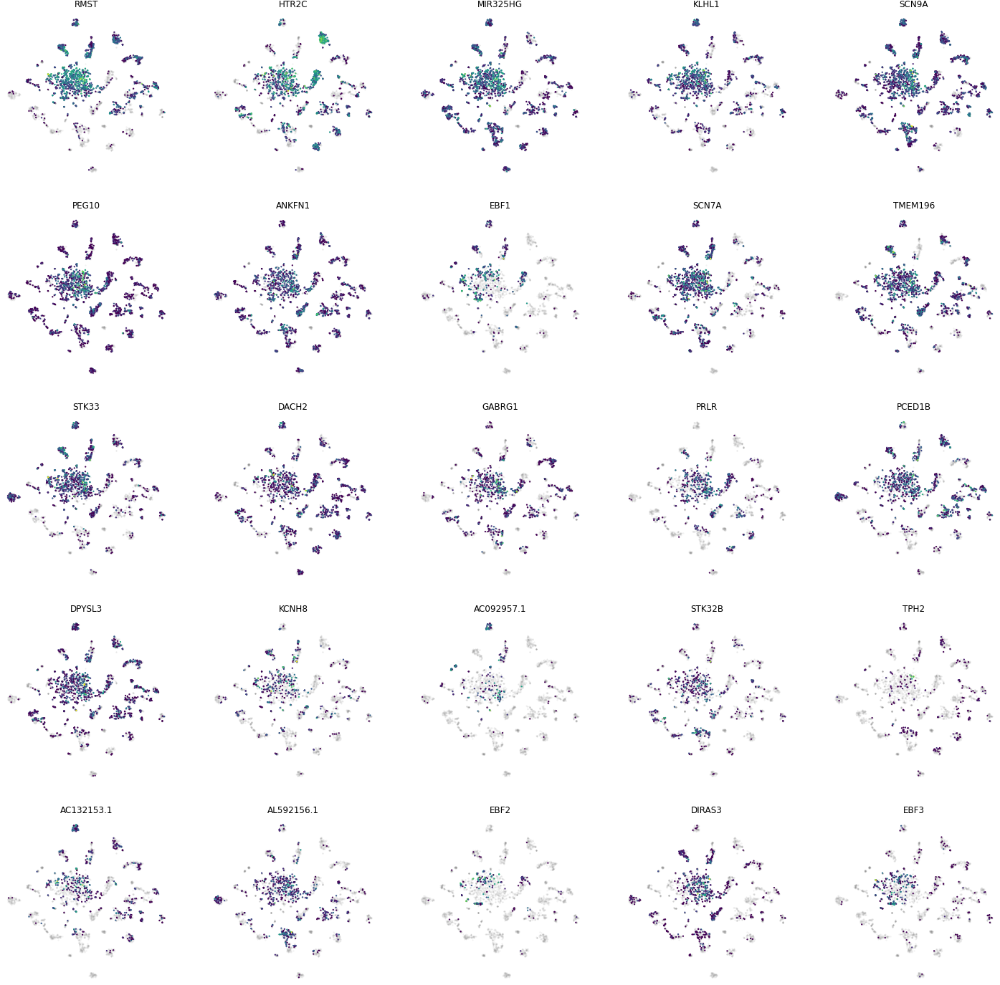

In [361]:
with loompy.connect('/proj/human_adult/20220222/harmony/revision/data/Downsampled10.loom', 'r') as ds:

    n = 10
    
    plt.figure(None, (25, 25), facecolor='white')
    gs = plt.GridSpec(5, 5)

    # nc = pd.Series(filtered_top_genes[n][:25]).isin(ncRNA_genes).to_numpy()
    to_plot = filtered_top_genes[n][:25]# [~nc]

    for i, g in enumerate(to_plot):
        plt.subplot(gs[i])
        exp = np.log(ds[np.where(ds.ra.Gene == g)[0][0], :].flatten() + 1)
        exp_cells = exp > 0
        plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], color='grey', alpha=0.1, s=5, lw=0, rasterized=True)
        plt.scatter(ds.ca.TSNE[exp_cells, 0], ds.ca.TSNE[exp_cells, 1], c=exp[exp_cells], s=5, lw=0, rasterized=True)
        plt.axis('off')
        plt.title(g, fontsize=12)
        plt.margins(0.05, 0.05)
            
    plt.show()    

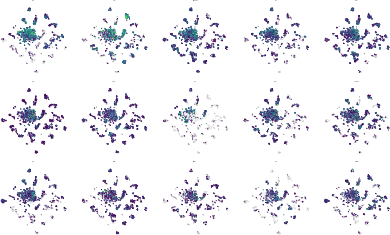

In [380]:
with loompy.connect('/proj/human_adult/20220222/harmony/revision/data/Downsampled10.loom', 'r') as ds:

    plt.figure(None, (7, 7 / (5 / 3)))
    gs = plt.GridSpec(3, 5)
    
    i = 0
    for g in filtered_top_genes[n][:15]:
        
        ax = plt.subplot(gs[i])
        exp = np.log2(ds[np.where(ds.ra.Gene == g)[0][0], :].flatten() + 1)
        cells = exp > 0

        plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], color='grey', alpha=0.05, s=1, lw=0, rasterized=True)
        plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c=exp[cells], s=1, lw=0, rasterized=True, cmap='viridis')

        plt.axis('off')
        plt.title(g, fontsize=1)
        plt.margins(0.02, 0.02)
        
        i += 1

    plt.savefig(f'{figure_folder}/LDA_genes.pdf', dpi=300)